Published on March 17, 2023. By Marília Prata, mpwolke 

In [145]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2

import warnings
warnings.filterwarnings('ignore')


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/dog-emotions-prediction/images/angry/7757094582_57943f86ea_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/6585062535_999ebe75b1_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/5591997280_374449d3a2_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/15006271570_ae5483cc0d_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/6804157447_48f3668c77_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/4569091661_bf0dc26de6_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/5416734020_6268e938a9_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/1661491166_e47d275242_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/9970288695_12bda09445_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/3567997681_99b0cffe65_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/5132048873_5f9c05218e_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/5901286410_11444f0cb7_b.jpg
/kaggle/input/dog-emotions-prediction/images/angry/

In [146]:
import tensorflow as tf 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, LeakyReLU, Dense, Dropout
impoexpand_dimstplotlib.pyplot as plt 
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau

In [147]:
#creatng a new dir containing only necessary data
import shutil
input_dir = "/kaggle/input/dog-emotions-prediction/images"
output_dir = "/kaggle/working/merged_images"


if not os.path.exists(output_dir):
    os.makedirs(output_dir)

subdirs = ["happy", "angry", "sad"]

for subdir in subdirs:
    subdir_path = os.path.join(input_dir, subdir)
    if os.path.exists(subdir_path):
        
        output_subdir = os.path.join(output_dir, subdir)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)
        
        for filename in os.listdir(subdir_path):
            src_path = os.path.join(subdir_path, filename)
            dst_path = os.path.join(output_subdir, filename)
            shutil.copyfile(src_path, dst_path)


In [148]:
#taking 20% images for testing from merged directory containing only sad,happy and angry sub dirs
import random

input_dir = "/kaggle/working/merged_images"
output_dir = "/kaggle/working/test"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)


subdirs = ["happy", "angry", "sad"]


percentage = 20

for subdir in subdirs:
    subdir_path = os.path.join(input_dir, subdir)
    if os.path.exists(subdir_path):
        
        output_subdir = os.path.join(output_dir, subdir)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)
        
        files = os.listdir(subdir_path)
        
        num_files = int(len(files) * percentage / 100)
        
        files_to_move = random.sample(files, num_files)
        
        for filename in files_to_move:
            src_path = os.path.join(subdir_path, filename)
            dst_path = os.path.join(output_subdir, filename)
            shutil.move(src_path, dst_path)


In [149]:


train_path = "/kaggle/working/merged_images"
test_path = "/kaggle/working/test"

In [150]:

x = plt.imread("/kaggle/input/dog-emotions-prediction/images/angry/100035066_bb2792d5c8_b.jpg")
x.shape

(384, 384, 3)

In [151]:
x.size

442368

In [152]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.)

In [153]:


train = datagen.flow_from_directory(train_path,target_size=(224,224),class_mode="sparse", seed=1, color_mode="grayscale", batch_size=128)
test = datagen.flow_from_directory(test_path,target_size=(224,224),class_mode="sparse", seed=1, color_mode="grayscale", batch_size=128)

Found 9259 images belonging to 3 classes.
Found 4156 images belonging to 3 classes.


In [154]:
dir(train)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__next__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_filepaths',
 '_flow_index',
 '_get_batches_of_transformed_samples',
 '_keras_api_names',
 '_keras_api_names_v1',
 '_set_index_array',
 'allowed_class_modes',
 'batch_index',
 'batch_size',
 'class_indices',
 'class_mode',
 'classes',
 'color_mode',
 'data_format',
 'directory',
 'dtype',
 'filenames',
 'filepaths',
 'image_data_generator',
 'image_shape',
 'index_array',
 'index_generator',
 'interpolation',
 'keep_aspect_ratio',
 'labels',
 'lock',
 'n',
 'next',
 'num_classes',
 'on_epoch_end',
 'reset',
 'sample_weight',
 'samples',
 'save_format',
 'save_prefix',

In [155]:


print(train.class_indices)
emotion_dict = {0:'angry', 1:'happy', 2:'sad'}

{'angry': 0, 'happy': 1, 'sad': 2}


In [156]:


x, y = train.next()
print(x.shape, y.shape)
train.reset()

(128, 224, 224, 1) (128,)


In [157]:

model = Sequential([
    Conv2D(32, (3,3), input_shape=(224, 224,1),padding="same"),
    LeakyReLU(),
    Conv2D(32, (3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.2),
    
    Conv2D(64,(3,3),padding="same"),
    LeakyReLU(),
    Conv2D(64,(3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.3),
    
    Conv2D(128,(3,3),padding="same"),
    LeakyReLU(),
    Conv2D(128,(3,3), padding="same"),
    LeakyReLU(),
    Conv2D(128,(3,3), padding="same"),
    LeakyReLU(),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.4),
    
    Flatten(),
#     tf.keras.layers.GlobalAveragePooling2D(),
#     Dropout(0.4),
    
    Dense(128, activation='relu'),
    Dropout(0.4),
#     Dense(64, activation="relu"),
    
    Dense(len(train.class_indices), activation="softmax")
])
model.summary()
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-3), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_289 (Conv2D)         (None, 224, 224, 32)      320       
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 224, 224, 32)      0         
                                                                 
 conv2d_290 (Conv2D)         (None, 224, 224, 32)      9248      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 224, 224, 32)      0         
                                                                 
 batch_normalization_285 (Ba  (None, 224, 224, 32)     128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                 

In [158]:


net = Sequential(name='DCNN')

net.add(
    Conv2D(
        filters=64,
        kernel_size=(5,5),
        input_shape=(224, 224, 1),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_1'
    )
)
net.add(BatchNormalization(name='batchnorm_1'))
net.add(
    Conv2D(
        filters=64,
        kernel_size=(5,5),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_2'
    )
)
net.add(BatchNormalization(name='batchnorm_2'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_1'))
net.add(Dropout(0.4, name='dropout_1'))

net.add(
    Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_3'
    )
)
net.add(BatchNormalization(name='batchnorm_3'))
net.add(
    Conv2D(
        filters=128,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_4'
    )
)
net.add(BatchNormalization(name='batchnorm_4'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_2'))
net.add(Dropout(0.4, name='dropout_2'))

net.add(
    Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_5'
    )
)
net.add(BatchNormalization(name='batchnorm_5'))
net.add(
    Conv2D(
        filters=256,
        kernel_size=(3,3),
        activation='elu',
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d_6'
    )
)
net.add(BatchNormalization(name='batchnorm_6'))

net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_3'))
net.add(Dropout(0.5, name='dropout_3'))

net.add(Flatten(name='flatten'))

net.add(
    Dense(
        128,
        activation='elu',
        kernel_initializer='he_normal',
        name='dense_1'
    )
)
net.add(BatchNormalization(name='batchnorm_7'))

net.add(Dropout(0.6, name='dropout_4'))

net.add(
    Dense(
        4,#ATTEntion 4 classes dense 4
        activation='softmax',
        name='out_layer'
    )
)

net.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

net.summary()

Model: "DCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      1664      
                                                                 
 batchnorm_1 (BatchNormaliza  (None, 224, 224, 64)     256       
 tion)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 224, 224, 64)      102464    
                                                                 
 batchnorm_2 (BatchNormaliza  (None, 224, 224, 64)     256       
 tion)                                                           
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 dropout_1 (Dropout)         (None, 112, 112, 64)      0      

In [159]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [160]:


early_stopping = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.00005,
    patience=11,
    verbose=1,
    restore_best_weights=True,
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=7,
    min_lr=1e-7,
    verbose=1,
)

callbacks = [
    early_stopping,
    lr_scheduler,
]

#Epochs

In [164]:
model.fit(train, validation_data=test, epochs=40, callbacks=callbacks)

Epoch 1/40
73/73 [==============================] - 43s 581ms/step - loss: 1.0615 - accuracy: 0.4372 - val_loss: 7.5996 - val_accuracy: 0.4110 - lr: 1.0000e-04
Epoch 2/40
73/73 [==============================] - 39s 533ms/step - loss: 1.0646 - accuracy: 0.4316 - val_loss: 5.8279 - val_accuracy: 0.4110 - lr: 1.0000e-04
Epoch 3/40
73/73 [==============================] - 42s 580ms/step - loss: 1.0504 - accuracy: 0.4386 - val_loss: 5.8797 - val_accuracy: 0.4110 - lr: 1.0000e-04
Epoch 4/40
73/73 [==============================] - 39s 540ms/step - loss: 1.0480 - accuracy: 0.4410 - val_loss: 3.3749 - val_accuracy: 0.4107 - lr: 1.0000e-04
Epoch 5/40
73/73 [==============================] - 39s 538ms/step - loss: 1.0436 - accuracy: 0.4486 - val_loss: 1.9697 - val_accuracy: 0.4187 - lr: 1.0000e-04
Epoch 6/40
73/73 [==============================] - 40s 541ms/step - loss: 1.0328 - accuracy: 0.4465 - val_loss: 1.2791 - val_accuracy: 0.4355 - lr: 1.0000e-04
Epoch 7/40
73/73 [======================

In [165]:
model.save('rakshit_dogEmotion_techdome21.h5')

In [ ]:
from tensorflow.keras.models import load_model

# Load the model from the h5 file
model = load_model('/kaggle/working/rakshit_dogEmotion_techdome.h5')

In [166]:


x,y = test.next()
preds = model.predict(x)
idx = np.argmax(preds, axis = 1)
# idx.shape
print('correct prediction:', np.sum((y == idx)*1)/128)

4/4 [==============================] - 0s 25ms/step
correct prediction: 0.5546875


In [169]:
idx


array([2., 2., 1., 2., 0., 1., 1., 1., 1., 1., 2., 0., 2., 1., 1., 0., 1.,
       2., 0., 2., 2., 1., 2., 2., 1., 0., 2., 0., 2., 1., 1., 1., 2., 1.,
       0., 0., 2., 2., 2., 1., 0., 2., 2., 1., 0., 2., 0., 1., 1., 1., 0.,
       0., 2., 2., 0., 2., 2., 0., 1., 0., 0., 1., 1., 0., 1., 0., 2., 0.,
       2., 2., 2., 1., 2., 0., 1., 0., 1., 2., 0., 2., 2., 1., 2., 1., 0.,
       0., 0., 1., 0., 2., 2., 2., 1., 1., 0., 2., 0., 1., 2., 2., 1., 2.,
       0., 0., 0., 0., 1., 2., 2., 2., 0., 2., 2., 2., 1., 2., 1., 0., 1.,
       1., 0., 1., 1., 1., 2., 1., 2., 2.], dtype=float32)

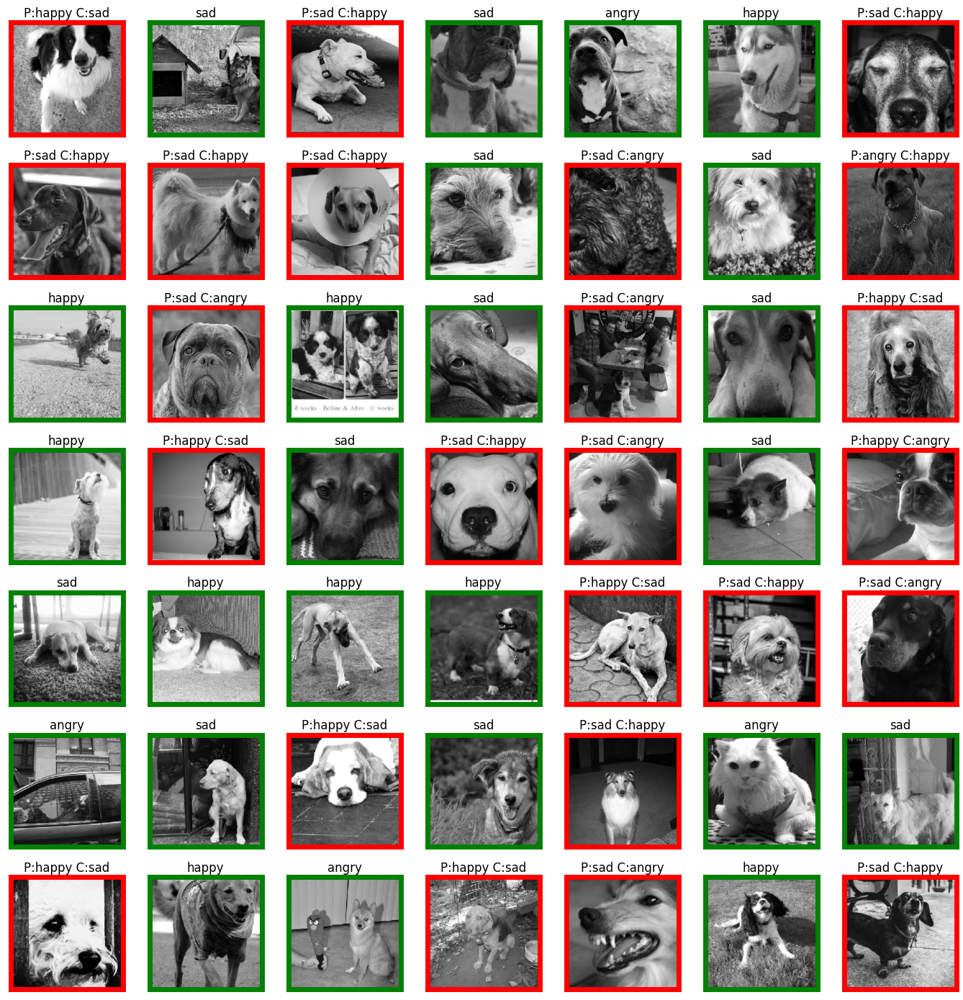

In [168]:


fig = plt.figure(1, (14, 14))

k = 0
for j in range(49):
    px = x[j]
    k += 1
    ax = plt.subplot(7, 7, k)
    ax.imshow(px, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    
 
    if  emotion_dict[y[j]] == emotion_dict[idx[j]]:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(5)
            ax.spines[axis].set_color('green')
        ax.set_title(emotion_dict[idx[j]])

    else:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(5)
            ax.spines[axis].set_color('red')
        ax.set_title('P:'+emotion_dict[idx[j]]+" C:"+emotion_dict[y[j]])
    plt.tight_layout()

In [172]:
#with transfer learning and image augmentation
import tensorflow as tf 
import numpy as np
import os
import matplotlib.pyplot as plt 
tf.__version__

'2.11.0'

In [173]:
import shutil
input_dir = "/kaggle/input/dog-emotions-prediction/images"
output_dir = "/kaggle/working/2nd"


if not os.path.exists(output_dir):
    os.makedirs(output_dir)

subdirs = ["happy", "angry", "sad"]

for subdir in subdirs:
    subdir_path = os.path.join(input_dir, subdir)
    if os.path.exists(subdir_path):
        
        output_subdir = os.path.join(output_dir, subdir)
        if not os.path.exists(output_subdir):
            os.makedirs(output_subdir)
        
        for filename in os.listdir(subdir_path):
            src_path = os.path.join(subdir_path, filename)
            dst_path = os.path.join(output_subdir, filename)
            shutil.copyfile(src_path, dst_path)


In [174]:
Name0=os.listdir('/kaggle/working/22nd')
Name=sorted(Name0)
n=len(Name)
N=list(range(n))
normal_mapping=dict(zip(Name,N)) 
reverse_mapping=dict(zip(N,Name)) 

In [175]:


img_generator = tf.keras.preprocessing.image.ImageDataGenerator(
                            
                            brightness_range=(0.5,1), 
                            channel_shift_range=0.2,
                             rotation_range=20,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='nearest',
                            rescale=1./255,
                            validation_split=0.3)
   

In [176]:


root_dir = '/kaggle/working/2nd'

img_generator_flow_train = img_generator.flow_from_directory(
    directory=root_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle=True,
    subset="training")

img_generator_flow_valid = img_generator.flow_from_directory(
    directory=root_dir,
    target_size=(224, 224),
    batch_size=32,
    shuffle=True,
    subset="validation")

Found 8102 images belonging to 3 classes.
Found 3470 images belonging to 3 classes.


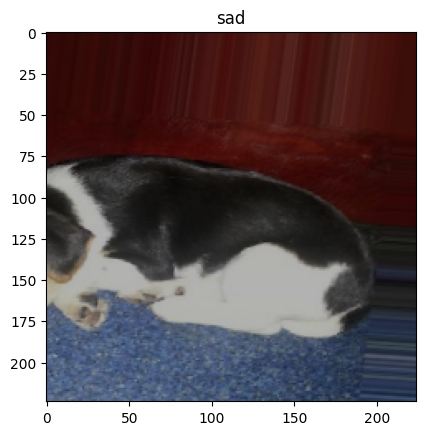

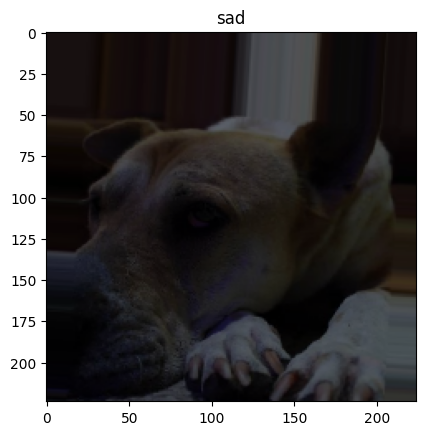

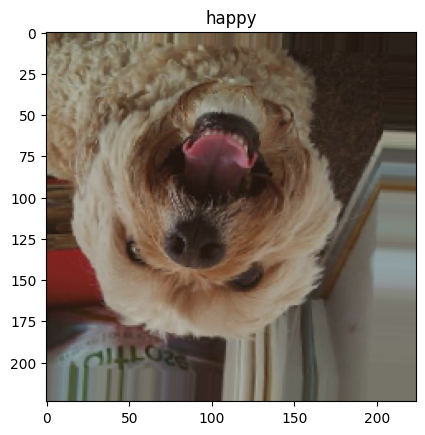

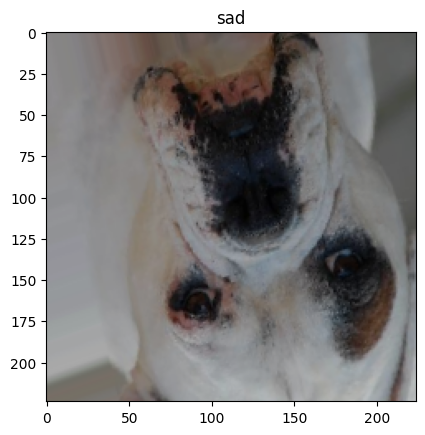

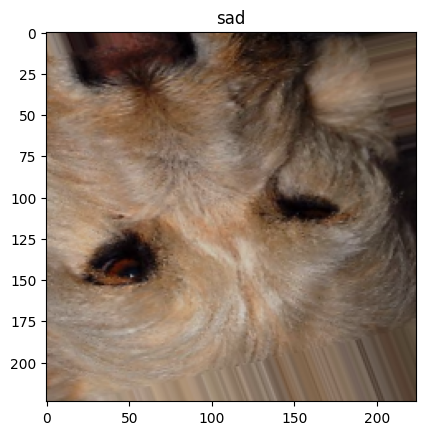

...

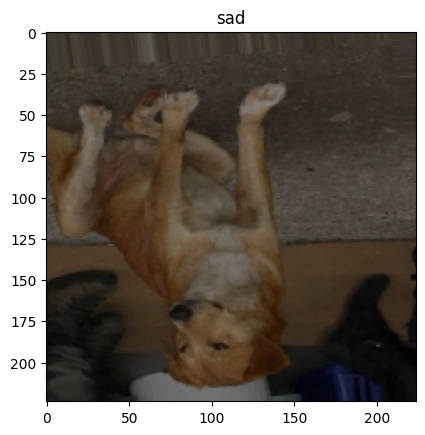

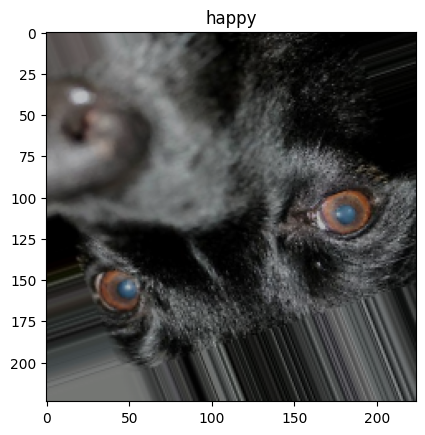

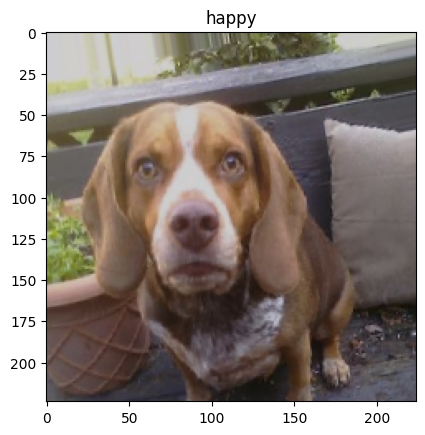

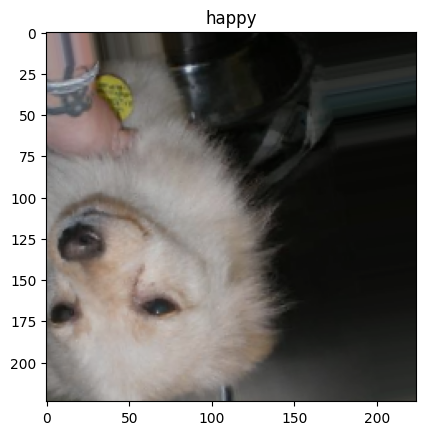

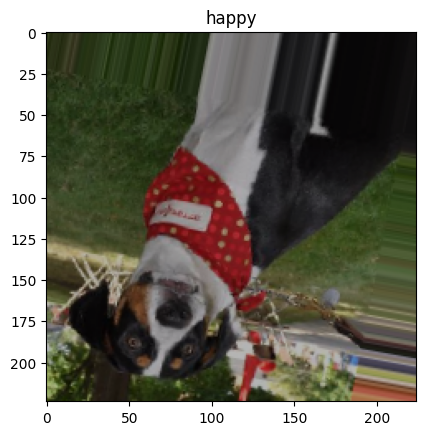

In [177]:


imgs, labels = next(iter(img_generator_flow_train))
for img, label in zip(imgs, labels):
    value=np.argmax(label)
    plt.imshow(img)
    plt.title(reverse_mapping[value])
    plt.show()

#Transfer Learning

In [178]:


base_model = tf.keras.applications.InceptionV3(input_shape=(224,224,3),
                                               include_top=False,
                                               weights = "imagenet"
                                               )

In [179]:
base_model.trainable = False

In [180]:
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(3, activation="softmax")
])

In [181]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 2, 2, 2048)       0         
 g2D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 8192)              0         
                                                                 
 dense_7 (Dense)             (None, 3)                 24579     
                                                                 
Total params: 21,827,363
Trainable params: 24,579
Non-trainable params: 21,802,784
_________________________________________________________________


In [182]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = 0.0001),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = [tf.keras.metrics.CategoricalAccuracy()])

In [128]:
model.fit(img_generator_flow_train, 
          validation_data=img_generator_flow_valid, 
          steps_per_epoch=10, epochs=20) 

Epoch 1/20
10/10 [==============================] - 23s 2s/step - loss: 1.7879 - categorical_accuracy: 0.3938 - val_loss: 1.6557 - val_categorical_accuracy: 0.3988
Epoch 2/20
10/10 [==============================] - 18s 2s/step - loss: 1.4929 - categorical_accuracy: 0.4406 - val_loss: 1.5682 - val_categorical_accuracy: 0.3873
Epoch 3/20
10/10 [==============================] - 17s 2s/step - loss: 1.5434 - categorical_accuracy: 0.3844 - val_loss: 1.5286 - val_categorical_accuracy: 0.4032
Epoch 4/20
10/10 [==============================] - 18s 2s/step - loss: 1.4397 - categorical_accuracy: 0.4594 - val_loss: 1.4448 - val_categorical_accuracy: 0.4280
Epoch 5/20
10/10 [==============================] - 18s 2s/step - loss: 1.3788 - categorical_accuracy: 0.4625 - val_loss: 1.4328 - val_categorical_accuracy: 0.4173
Epoch 6/20
10/10 [==============================] - 17s 2s/step - loss: 1.4365 - categorical_accuracy: 0.4313 - val_loss: 1.3891 - val_categorical_accuracy: 0.4395
Epoch 7/20
10/10

In [129]:
model.save("Rakshit_tl_techdomeModel2.h5")

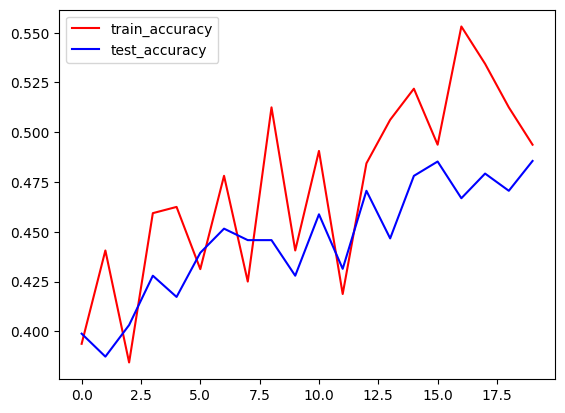

In [130]:


plt.plot(model.history.history["categorical_accuracy"], c="r", label="train_accuracy")
plt.plot(model.history.history["val_categorical_accuracy"], c="b", label="test_accuracy")
plt.legend(loc="upper left")
plt.show()

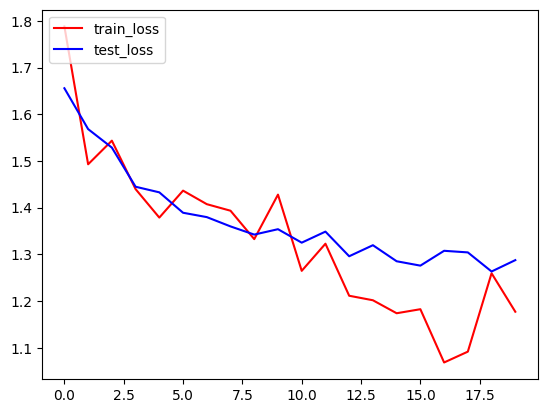

In [131]:



plt.plot(model.history.history["loss"], c="r", label="train_loss")
plt.plot(model.history.history["val_loss"], c="b", label="test_loss")
plt.legend(loc="upper left")
plt.show()

#Interpretation with Grad Cam

In [132]:
imgs, labels = next(iter(img_generator_flow_valid))

In [73]:
from tensorflow.keras.models import load_model

# Load the model from the h5 file
model = load_model('/kaggle/working/Rakshit_tl_techdomeModel2.h5')

In [133]:

for layer in model.layers:
    print(layer.name)

inception_v3
max_pooling2d_17
flatten_3
dense_4


In [134]:
base_model = model.layers[0]

In [135]:

last_conv_layer_name = "mixed10"
classifier_layer_names = [layer.name for layer in model.layers][1:]

In [136]:


import numpy as np
import tensorflow as tf
from tensorflow import keras

from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [137]:

def get_img_array(img_path, size):
   
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
  
    array = keras.preprocessing.image.img_to_array(img)
 
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(
    img_array, base_model, model, last_conv_layer_name, classifier_layer_names):
 
    last_conv_layer = base_model.get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(base_model.inputs, last_conv_layer.output)

    
    classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = keras.Model(classifier_input, x)

    
    with tf.GradientTape() as tape:
       
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

  
    grads = tape.gradient(top_class_channel, last_conv_layer_output)


    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

  
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

   
    heatmap = np.mean(last_conv_layer_output, axis=-1)

  
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

In [138]:
#prediction

preds = model.predict(imgs)
pred_labels = tf.argmax(preds, axis = -1)

print("Prediction output:", preds)
print("Predicted label:", pred_labels)

1/1 [==============================] - 2s 2s/step
Prediction output: [[0.03716082 0.13416521 0.828674  ]
 [0.03225195 0.47140044 0.4963476 ]
 [0.05610713 0.00834585 0.93554705]
 [0.01109855 0.9755045  0.01339694]
 [0.28073707 0.34532836 0.37393454]
 [0.15688741 0.23942278 0.6036898 ]
 [0.04647557 0.3701528  0.58337164]
 [0.0401689  0.23147781 0.72835326]
 [0.04534455 0.73586106 0.21879438]
 [0.0577387  0.37577027 0.566491  ]
 [0.00670252 0.8964564  0.09684107]
 [0.05301958 0.6073429  0.33963752]
 [0.02664658 0.49476612 0.47858733]
 [0.9258536  0.01684087 0.05730553]
 [0.02067665 0.81368184 0.16564152]
 [0.19654801 0.41639772 0.38705423]
 [0.13828434 0.6737979  0.18791775]
 [0.67347455 0.14635403 0.18017143]
 [0.15103203 0.17640369 0.6725643 ]
 [0.02638061 0.24376203 0.7298573 ]
 [0.07735693 0.85187453 0.07076854]
 [0.3105732  0.38941795 0.30000886]
 [0.05506989 0.86714345 0.07778664]
 [0.23641407 0.40699306 0.35659286]
 [0.88822573 0.03926944 0.07250475]
 [0.02858796 0.07118377 0.90022

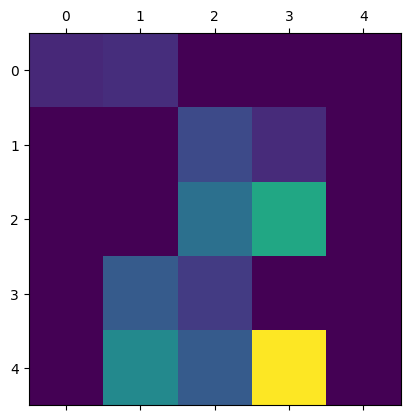

In [139]:

heatmaps = []

for img in imgs:
    heatmap = make_gradcam_heatmap(
    tf.expand_dims(img,axis=0),
        base_model, model, 
        last_conv_layer_name, 
        classifier_layer_names
  )
    heatmaps.append(heatmap)



plt.matshow(heatmaps[0])
plt.show()

#Predicted label and heatmap

Predicted label: sad
True label: sad


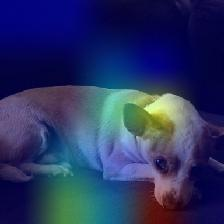

Predicted label: sad
True label: sad


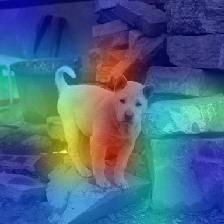

Predicted label: sad
True label: angry


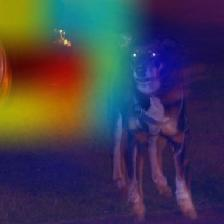

Predicted label: happy
True label: happy


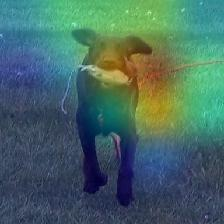

Predicted label: sad
True label: sad


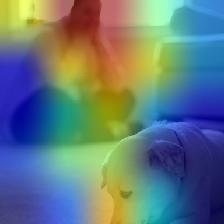

Predicted label: sad
True label: angry


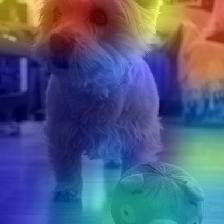

Predicted label: sad
True label: sad


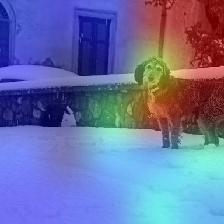

Predicted label: sad
True label: sad


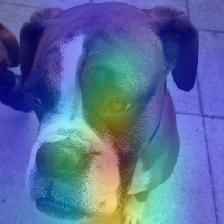

Predicted label: happy
True label: happy


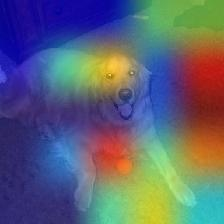

Predicted label: sad
True label: happy


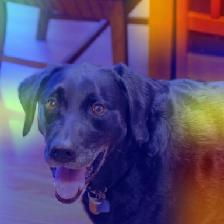

Predicted label: happy
True label: angry


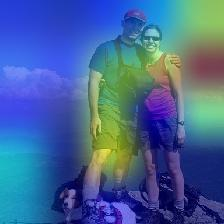

Predicted label: happy
True label: happy


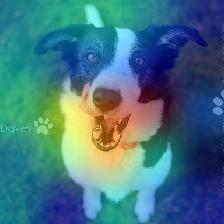

Predicted label: happy
True label: happy


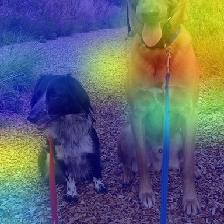

Predicted label: angry
True label: happy


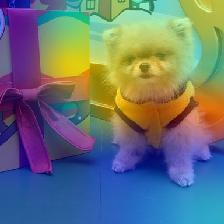

Predicted label: happy
True label: sad


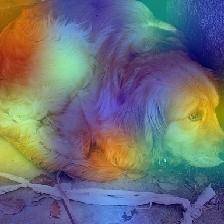

Predicted label: happy
True label: happy


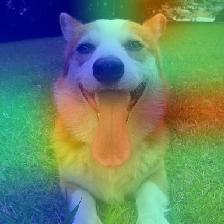

Predicted label: happy
True label: sad


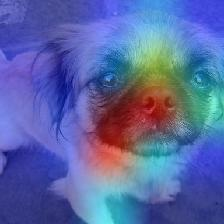

Predicted label: angry
True label: happy


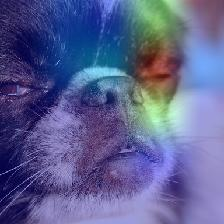

Predicted label: sad
True label: sad


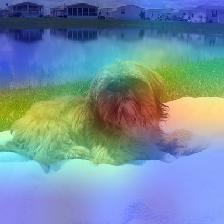

Predicted label: sad
True label: happy


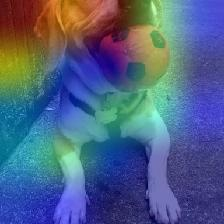

Predicted label: happy
True label: sad


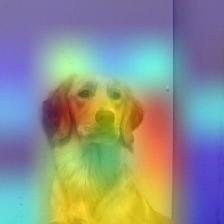

Predicted label: happy
True label: happy


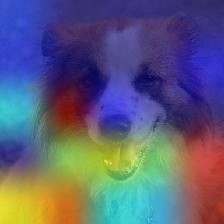

Predicted label: happy
True label: happy


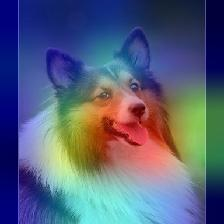

Predicted label: happy
True label: sad


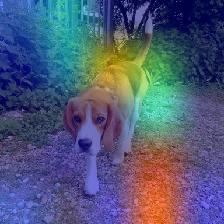

Predicted label: angry
True label: happy


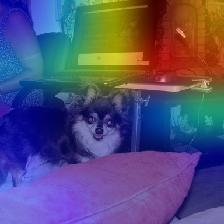

Predicted label: sad
True label: happy


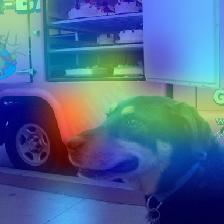

Predicted label: sad
True label: happy


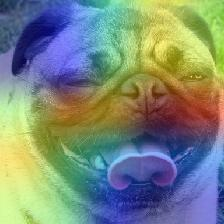

Predicted label: sad
True label: happy


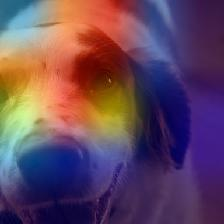

Predicted label: sad
True label: sad


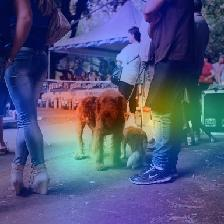

Predicted label: sad
True label: happy


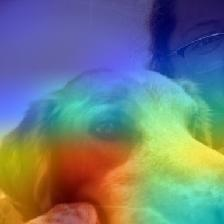

Predicted label: happy
True label: happy


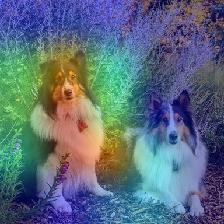

Predicted label: sad
True label: angry


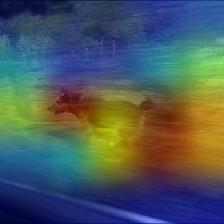

In [140]:


from pathlib import Path

for img, pred_label, true_label, heatmap in zip(imgs, pred_labels, labels, heatmaps): 
    
    heatmap = np.uint8(255 * heatmap)

    
    jet = cm.get_cmap("jet")


    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    
    superimposed_img = jet_heatmap * 0.003 + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

   
    save_path = "saved_img.jpg"
    superimposed_img.save(save_path)

    
    pred_file_path = np.argmax(img_generator_flow_valid.labels == pred_label)
    pred_label_name = Path(img_generator_flow_valid.filepaths[pred_file_path]).parent.name

    true_file_path = np.argmax(img_generator_flow_valid.labels == tf.argmax(true_label))
    true_label_name = Path(img_generator_flow_valid.filepaths[true_file_path]).parent.name

    print("Predicted label:",pred_label_name)
    print("True label:", true_label_name)

    display(Image(save_path))

#Classification Report

In [141]:


LABEL=[]
for item in labels:
    LABEL+=[np.argmax(item)]
print(LABEL)

[2, 2, 0, 1, 2, 0, 2, 2, 1, 1, 0, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 0]


In [142]:
PRED=pred_labels.numpy().tolist()
print(PRED)

[2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 1, 1, 1, 0, 1, 1, 1, 0, 2, 2, 1, 1, 1, 1, 0, 2, 2, 2, 2, 2, 1, 2]


In [143]:
from sklearn.metrics import classification_report
print(classification_report(LABEL, PRED))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       0.62      0.47      0.53        17
           2       0.44      0.64      0.52        11

    accuracy                           0.47        32
   macro avg       0.35      0.37      0.35        32
weighted avg       0.48      0.47      0.46        32



In [144]:
print(reverse_mapping)

{0: 'angry', 1: 'happy', 2: 'sad'}
